# HOMEWORK 2
For this homework you will have to complete and implement the colour balancing for:
* Gray world algorithm
* Scale-by-max algorithm

You are free to use your own images. Experiment with more images and think about the effect each of the algorithms has on the resulting (balanced) image.

### Colour Balancing
In this notebook we will show different type of colour balancing making use of von Kries' hypothesis.

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 5]

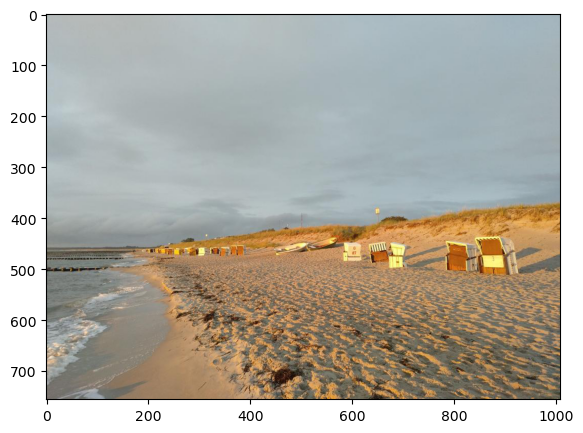

In [3]:
img = cv2.imread('../data/sea.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

### White patch
In white patch algorithm we choose a group of pixels we know they should be white. We then scale the resulting image colour channels by this white patch.

(<Axes: >, <matplotlib.image.AxesImage at 0x7cd1ecb2f160>)

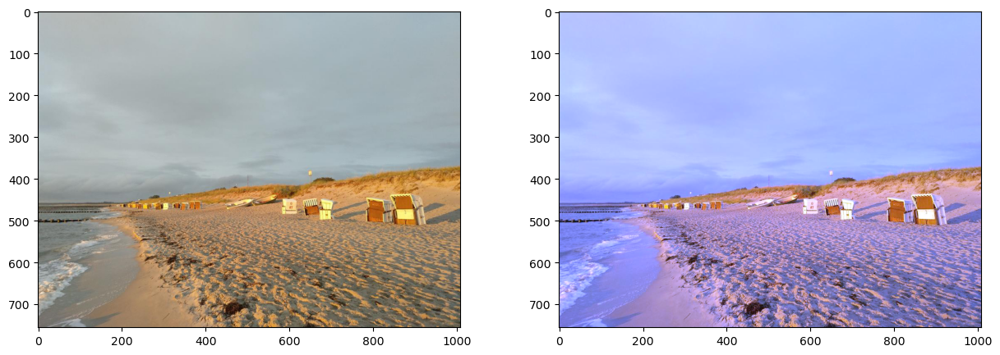

In [4]:
# Define white patch and the coefficients
row, col = 485, 864
white = img[row, col, :]
coeffs = 255.0/white

# Apply white balancing and generate balanced image
balanced = np.zeros_like(img, dtype=np.float32)
for channel in range(3):
    balanced[..., channel] = img[..., channel] * coeffs[channel]

# White patching does not guarantee that the dynamic range is preserved, images must be clipped.
balanced = balanced/255
balanced[balanced > 1] = 1

plt.subplot(121), plt.imshow(img)
plt.subplot(122), plt.imshow(balanced)

### Gray world
This algorithm assumes that a scene, on average, is gray.

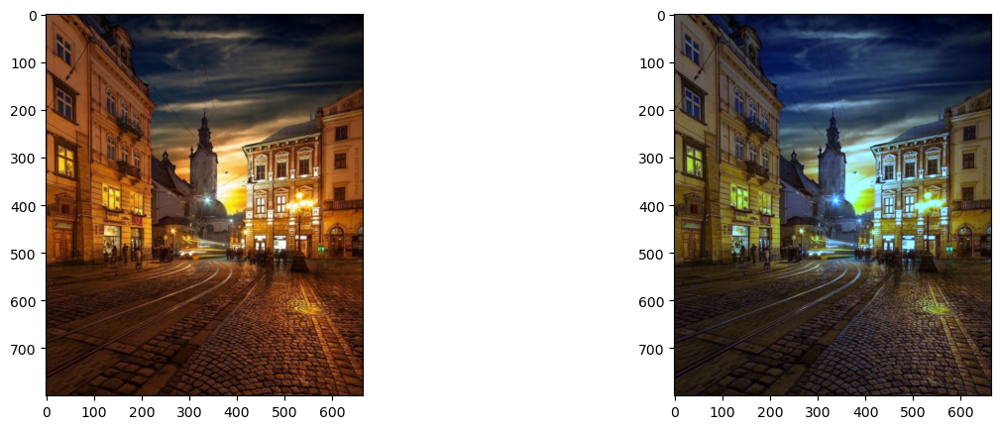

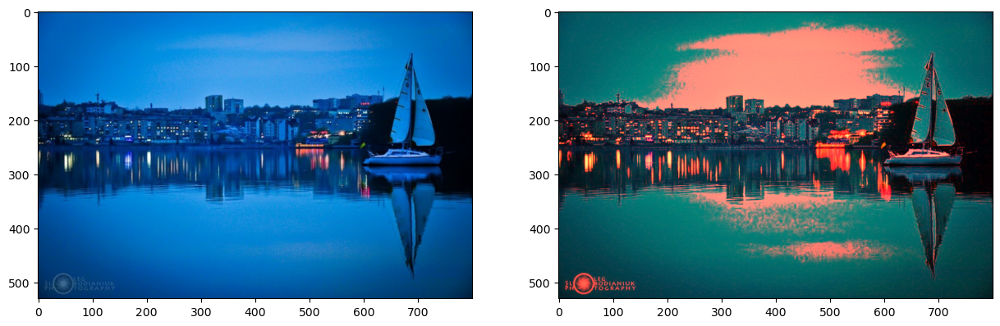

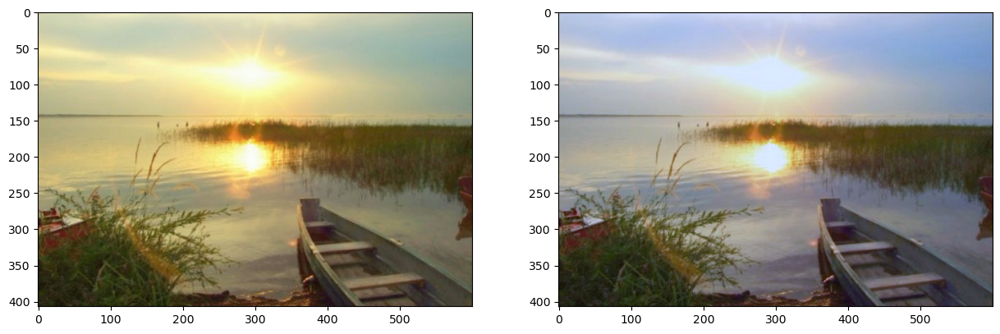

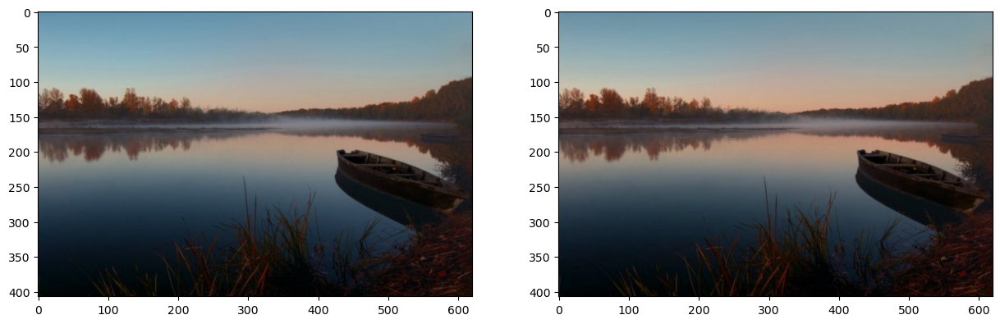

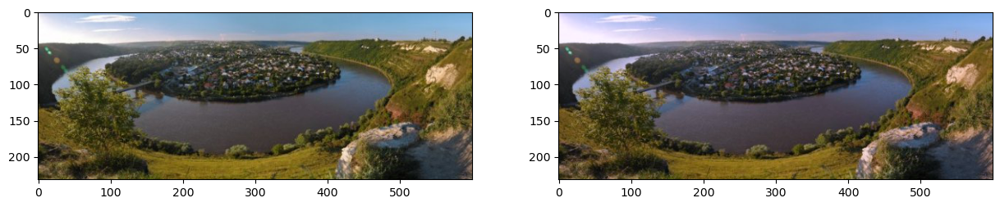

In [5]:
def improved_gray_world(image):
    # Convert the image to float32 for precision
    img_float = image.astype(np.float32)

    # Detect edges using the Sobel operator
    sobelx = cv2.Sobel(img_float, cv2.CV_32F, 1, 0, ksize=3)  # Detect horizontal edges
    sobely = cv2.Sobel(img_float, cv2.CV_32F, 0, 1, ksize=3)  # Detect vertical edges
    edges = cv2.magnitude(sobelx, sobely)  # Calculate the gradient magnitude for each pixel

    # Normalize edge map to [0, 1]
    edges = cv2.normalize(edges, None, 0, 1, cv2.NORM_MINMAX)

    # Threshold edge map to obtain binary edge image
    _, edge_binary = cv2.threshold(edges, 0.1, 1, cv2.THRESH_BINARY)

    # Convert binary edge image to 8-bit
    edge_binary = (edge_binary * 255).astype(np.uint8)

    # Convert to grayscale
    edge_binary_gray = cv2.cvtColor(edge_binary, cv2.COLOR_BGR2GRAY)

    # Find contours in the edge image
    contours, _ = cv2.findContours(edge_binary_gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a weight map based on contour sizes
    weight_map = np.ones(image.shape[:2], dtype=np.float32)  # Initialize weight map
    for contour in contours:
        mask = np.zeros(image.shape[:2], dtype=np.uint8)  # Mask for the current contour
        cv2.drawContours(mask, [contour], -1, 1, thickness=cv2.FILLED)  # Fill the mask with the contour
        size = cv2.contourArea(contour)  # Calculate the area of the contour
        weight_map[mask == 1] = 1 - size / (image.shape[0] * image.shape[1])  # Assign weight to the contour

    # Apply the weight map to each channel
    weighted_sum = np.zeros(3, dtype=np.float32)  # Initialize weighted sums for each channel
    total_weight = np.zeros(3, dtype=np.float32)  # Initialize total weight for each channel
    for c in range(3):
        weighted_sum[c] = np.sum(image[:, :, c] * weight_map)  # Calculate weighted sum for the channel
        total_weight[c] = np.sum(weight_map)  # Calculate total weight

    # Calculate the mean values for each channel
    mean_rgb = weighted_sum / total_weight
    gray_value = np.mean(mean_rgb)  # Calculate the mean gray value

    # Calculate gain coefficients for each channel
    gain = gray_value / mean_rgb

    # Apply the gain to each channel
    corrected_img = np.zeros_like(img_float)  # Initialize the corrected image
    for c in range(3):
        corrected_img[:, :, c] = img_float[:, :, c] * gain[c]  # Apply gain to the channel

    # Clip the values to [0, 255] and convert to uint8
    corrected_img = np.clip(corrected_img, 0, 255).astype(np.uint8)

    return corrected_img  # Return the corrected image

# Run the improved gray world algorithm on ./Lviv_Mykola_Kochergan.jpg, ./River.jpg and show the results
image_paths = ['./Lviv_Mykola_Kochergan.jpg', './Tern.jpg', './River.jpg', './River2.jpg', './River3.jpg']
for img_path in image_paths:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    corrected_img = improved_gray_world(img)
    plt.figure()
    plt.subplot(121), plt.imshow(img)
    plt.subplot(122), plt.imshow(corrected_img)
    plt.show()

### Scale-by-max
This is a straightforward algorithm that scales each colour channel by its maximum value. Note that it is sensitive to noise and saturations.

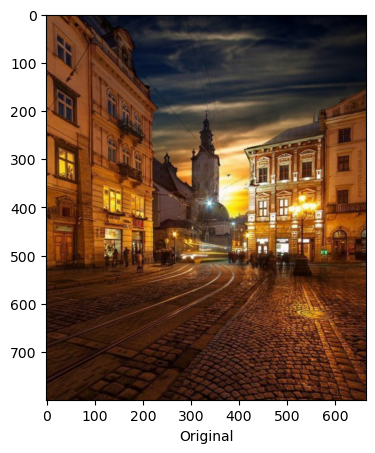

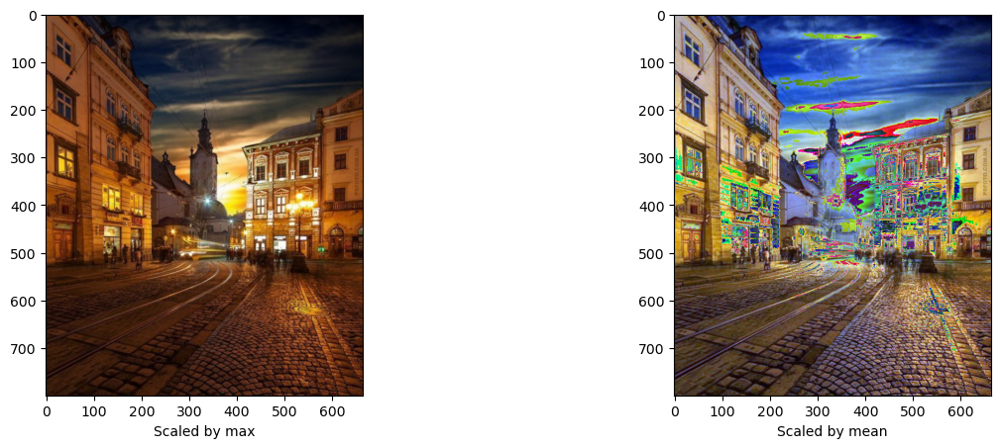

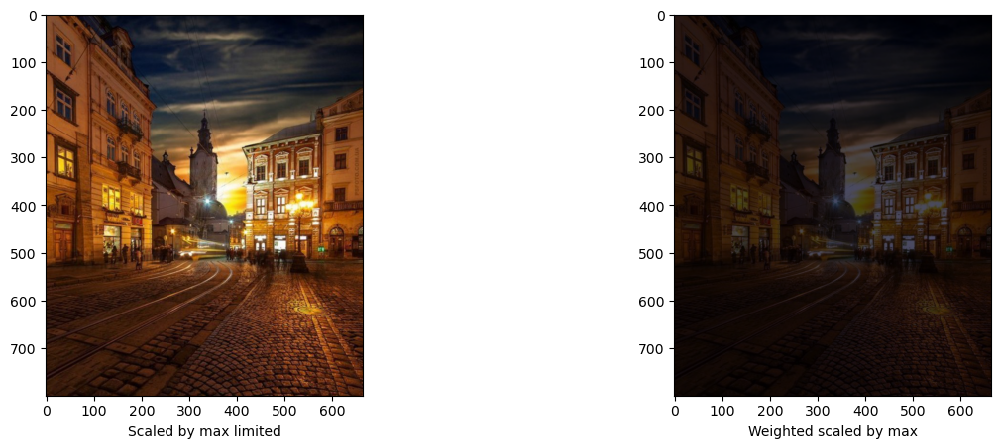

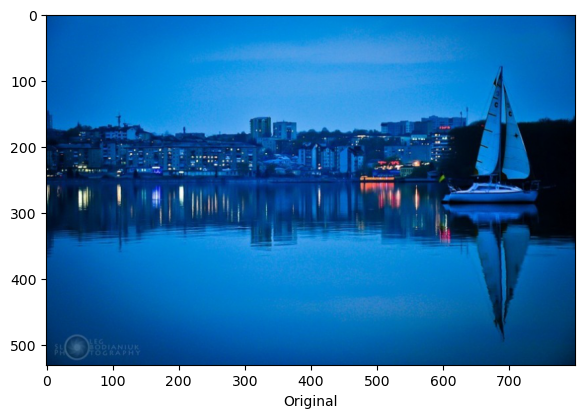

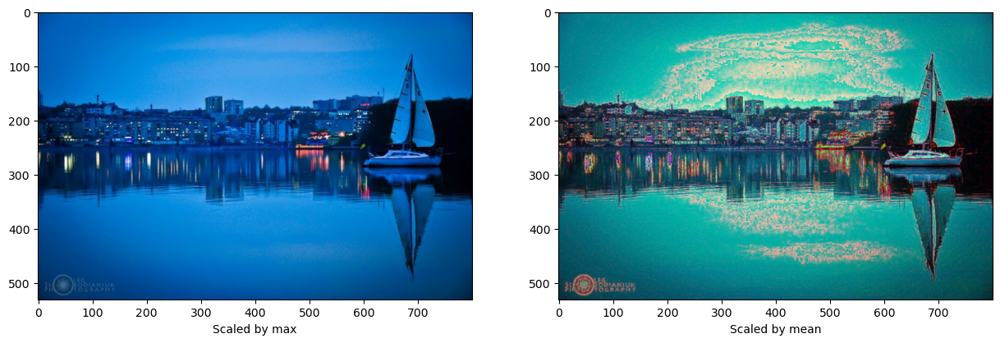

...

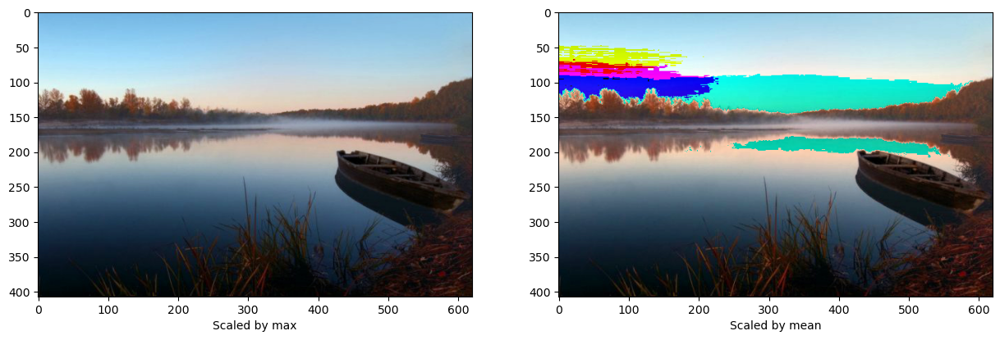

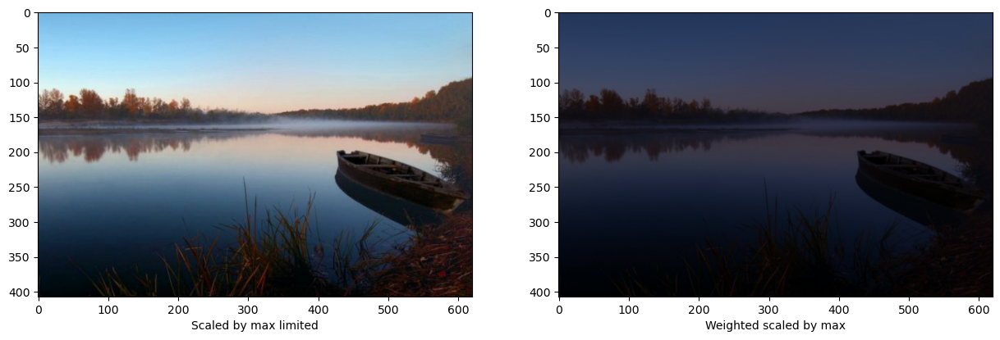

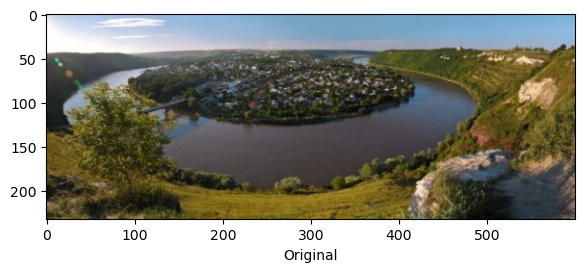

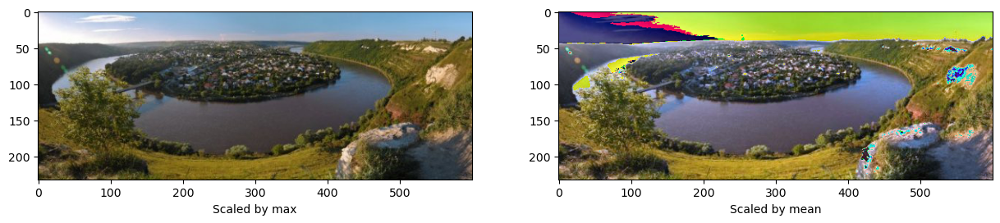

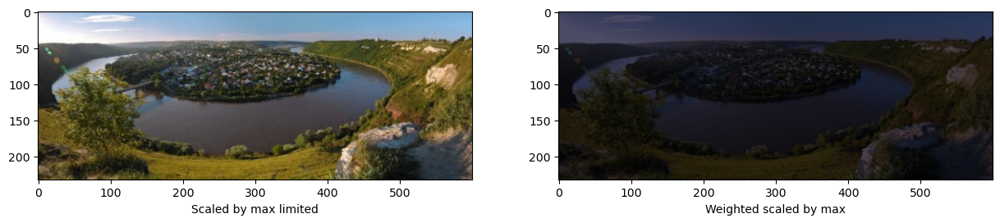

In [21]:
# Load your image
def scale_by_max(img):
    # Compute the maximum values for all three colour channels (red, green, blue)
    max_r = np.max(img[:, :, 0])
    max_g = np.max(img[:, :, 1])
    max_b = np.max(img[:, :, 2])

    scale_r = 255.0/max_r
    scale_g = 255.0/max_g
    scale_b = 255.0/max_b

    # Apply scale-by-max balancing and generate the balanced image
    balanced = img.copy()
    balanced[:, :, 0] = img[:, :, 0] * scale_r
    balanced[:, :, 1] = img[:, :, 1] * scale_g
    balanced[:, :, 2] = img[:, :, 2] * scale_b

    balanced = np.clip(balanced, 0, 255).astype(np.uint8)
    return balanced

def scale_by_mean(image):
    # Обчислити середні значення для кожного каналу
    mean_r = np.mean(image[:, :, 0])
    mean_g = np.mean(image[:, :, 1])
    mean_b = np.mean(image[:, :, 2])

    # Обчислити коефіцієнти масштабування
    scale_r = 128.0 / mean_r
    scale_g = 128.0 / mean_g
    scale_b = 128.0 / mean_b

    # Масштабувати кожен канал
    scaled_img = image.copy()
    scaled_img[:, :, 0] = image[:, :, 0] * scale_r
    scaled_img[:, :, 1] = image[:, :, 1] * scale_g
    scaled_img[:, :, 2] = image[:, :, 2] * scale_b

    # Обрізання значень до діапазону [0, 255]
    scaled_img = np.clip(scaled_img, 0, 255).astype(np.uint8)
    return scaled_img

def scale_by_max_limited(image, limit=2.0):
    # Знайти максимальні значення для кожного каналу
    max_r = np.max(image[:, :, 0])
    max_g = np.max(image[:, :, 1])
    max_b = np.max(image[:, :, 2])

    # Обчислити коефіцієнти масштабування
    scale_r = min(255.0 / max_r, limit)
    scale_g = min(255.0 / max_g, limit)
    scale_b = min(255.0 / max_b, limit)

    # Масштабувати кожен канал
    scaled_img = image.copy()
    scaled_img[:, :, 0] = image[:, :, 0] * scale_r
    scaled_img[:, :, 1] = image[:, :, 1] * scale_g
    scaled_img[:, :, 2] = image[:, :, 2] * scale_b

    # Обрізання значень до діапазону [0, 255]
    scaled_img = np.clip(scaled_img, 0, 255).astype(np.uint8)
    return scaled_img

def weighted_scale_by_max(image, weights=(0.3, 0.3, 0.4)):
    # Знайти максимальні значення для кожного каналу
    max_r = np.max(image[:, :, 0])
    max_g = np.max(image[:, :, 1])
    max_b = np.max(image[:, :, 2])

    # Обчислити коефіцієнти масштабування з вагами
    scale_r = 255.0 / max_r * weights[0]
    scale_g = 255.0 / max_g * weights[1]
    scale_b = 255.0 / max_b * weights[2]

    # Масштабувати кожен канал
    scaled_img = image.copy()
    scaled_img[:, :, 0] = image[:, :, 0] * scale_r
    scaled_img[:, :, 1] = image[:, :, 1] * scale_g
    scaled_img[:, :, 2] = image[:, :, 2] * scale_b

    # Обрізання значень до діапазону [0, 255]
    scaled_img = np.clip(scaled_img, 0, 255).astype(np.uint8)
    return scaled_img

image_paths = ['./Lviv_Mykola_Kochergan.jpg', './Tern.jpg', './River.jpg', './River2.jpg', './River3.jpg']
for img_path in image_paths:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    scaled_max_img = scale_by_max(img)
    scaled_mean_img = scale_by_mean(img)
    scaled_max_limited_img = scale_by_max_limited(img)
    weighted_scaled_max_img = weighted_scale_by_max(img)
    plt.figure()
    plt.subplot(121), plt.imshow(img)
    plt.xlabel('Original')
    plt.show()
    plt.figure()
    plt.subplot(121), plt.imshow(scaled_max_img)
    plt.xlabel('Scaled by max')
    plt.subplot(122), plt.imshow(scaled_mean_img)
    plt.xlabel('Scaled by mean')
    plt.show()
    plt.figure()
    plt.subplot(121), plt.imshow(scaled_max_limited_img)
    plt.xlabel('Scaled by max limited')
    plt.subplot(122), plt.imshow(weighted_scaled_max_img)
    plt.xlabel('Weighted scaled by max')
    plt.show()